# Explore model once it has been trained

In [1]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

from network.models.architectures.CIL_multiview.CIL_multiview import CIL_multiview
import os
from configs import g_conf, set_type_of_process, merge_with_yaml

exp_batch = 'CILv2'
exp_name = 'CILv2_3cam_vit_Town01Full'

In [2]:
merge_with_yaml(os.path.join('configs', exp_batch, f'{exp_name}.yaml'))
g_conf.PROCESS_NAME = 'train_val'
g_conf.DATASET_PATH = '/datatmp/Datasets/yixiao/CARLA'

os.environ['DATASET_PATH'] = g_conf.DATASET_PATH

model = CIL_multiview(g_conf.MODEL_CONFIGURATION)

Loading pretrained weights from: https://download.pytorch.org/models/vit_b_32-d86f8d99.pth...


In [3]:
model

CIL_multiview(
  (encoder_embedding_perception): VisionTransformer(
    (conv_proj): Conv2d(3, 768, kernel_size=(32, 32), stride=(32, 32))
    (encoder): Encoder(
      (dropout): Dropout(p=0.0, inplace=False)
      (layers): Sequential(
        (encoder_layer_0): EncoderBlock(
          (ln_1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
          (self_attention): MultiheadAttention(
            (out_proj): NonDynamicallyQuantizableLinear(in_features=768, out_features=768, bias=True)
          )
          (dropout): Dropout(p=0.0, inplace=False)
          (ln_2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
          (mlp): MLPBlock(
            (linear_1): Linear(in_features=768, out_features=3072, bias=True)
            (act): GELU()
            (dropout_1): Dropout(p=0.0, inplace=False)
            (linear_2): Linear(in_features=3072, out_features=768, bias=True)
            (dropout_2): Dropout(p=0.0, inplace=False)
          )
        )
        (encoder_layer_

## Load a pretrained checkpoint

In [4]:
from _utils.training_utils import check_saved_checkpoints

latest_checkpoint = check_saved_checkpoints(os.path.join('/home/dporres/Documents/PRUEBA/CILv2_multiview/VisionTFM',
                                                         '_results',
                                                         g_conf.EXPERIMENT_BATCH_NAME,
                                                         g_conf.EXPERIMENT_NAME,
                                                         'checkpoints'))

In [5]:
latest_checkpoint

'/home/dporres/Documents/PRUEBA/CILv2_multiview/VisionTFM/_results/CILv2/CILv2_3cam_vit_Town01Full/checkpoints/CILv2_multiview_attention_80_353016.pth'

In [6]:
import torch

checkpoint = torch.load(latest_checkpoint)

In [7]:
checkpoint['model']

OrderedDict([('_model.tfx_class_token',
              tensor([[[-4.4972e-03, -1.2049e-03, -8.8942e-03, -1.0903e-02, -1.3768e-02,
                         2.7268e-02,  3.2536e-03,  6.5453e-02,  5.7828e-03,  8.2787e-04,
                         9.0422e-04,  5.1996e-03, -9.1170e-03,  1.9343e-02, -4.0995e-03,
                         6.5558e-03, -9.0981e-03, -6.5428e-03, -6.4278e-03,  1.2826e-02,
                        -6.9174e-03, -4.0944e-03, -8.1965e-03,  4.5711e-02, -2.3963e-03,
                         9.9305e-04, -5.6588e-03, -4.5699e-03, -6.3736e-03,  7.2764e-03,
                         3.3657e-03,  2.8413e-04, -7.3598e-03, -1.3300e-03,  8.2440e-03,
                        -5.7169e-03,  1.0094e-02, -7.9648e-03, -4.1698e-02,  5.9487e-02,
                        -9.4528e-03, -2.8337e-03, -1.2906e-02,  1.1221e-02, -7.0067e-03,
                         2.7589e-04, -1.8944e-02, -3.0013e-02,  1.0540e-02,  8.2764e-03,
                         6.4406e-03, -5.1002e-03, -6.1087e-03,  7.2190

In [8]:
# As we can see, the keys have _model at the beginning; let's remove it
new_state_dict = {}
for k, v in checkpoint['model'].items():
    new_state_dict[k[7:]] = v

In [9]:
new_state_dict

{'tfx_class_token': tensor([[[-4.4972e-03, -1.2049e-03, -8.8942e-03, -1.0903e-02, -1.3768e-02,
            2.7268e-02,  3.2536e-03,  6.5453e-02,  5.7828e-03,  8.2787e-04,
            9.0422e-04,  5.1996e-03, -9.1170e-03,  1.9343e-02, -4.0995e-03,
            6.5558e-03, -9.0981e-03, -6.5428e-03, -6.4278e-03,  1.2826e-02,
           -6.9174e-03, -4.0944e-03, -8.1965e-03,  4.5711e-02, -2.3963e-03,
            9.9305e-04, -5.6588e-03, -4.5699e-03, -6.3736e-03,  7.2764e-03,
            3.3657e-03,  2.8413e-04, -7.3598e-03, -1.3300e-03,  8.2440e-03,
           -5.7169e-03,  1.0094e-02, -7.9648e-03, -4.1698e-02,  5.9487e-02,
           -9.4528e-03, -2.8337e-03, -1.2906e-02,  1.1221e-02, -7.0067e-03,
            2.7589e-04, -1.8944e-02, -3.0013e-02,  1.0540e-02,  8.2764e-03,
            6.4406e-03, -5.1002e-03, -6.1087e-03,  7.2190e-03, -2.1260e-02,
           -3.4526e-04, -3.3051e-02,  4.7215e-03, -1.3939e-02, -9.6334e-03,
           -8.1722e-03, -2.1636e-02, -1.7888e-03,  1.2470e-02,  5.501

In [10]:
from typing import OrderedDict

new_state_dict = OrderedDict(new_state_dict)

In [11]:
new_state_dict

OrderedDict([('tfx_class_token',
              tensor([[[-4.4972e-03, -1.2049e-03, -8.8942e-03, -1.0903e-02, -1.3768e-02,
                         2.7268e-02,  3.2536e-03,  6.5453e-02,  5.7828e-03,  8.2787e-04,
                         9.0422e-04,  5.1996e-03, -9.1170e-03,  1.9343e-02, -4.0995e-03,
                         6.5558e-03, -9.0981e-03, -6.5428e-03, -6.4278e-03,  1.2826e-02,
                        -6.9174e-03, -4.0944e-03, -8.1965e-03,  4.5711e-02, -2.3963e-03,
                         9.9305e-04, -5.6588e-03, -4.5699e-03, -6.3736e-03,  7.2764e-03,
                         3.3657e-03,  2.8413e-04, -7.3598e-03, -1.3300e-03,  8.2440e-03,
                        -5.7169e-03,  1.0094e-02, -7.9648e-03, -4.1698e-02,  5.9487e-02,
                        -9.4528e-03, -2.8337e-03, -1.2906e-02,  1.1221e-02, -7.0067e-03,
                         2.7589e-04, -1.8944e-02, -3.0013e-02,  1.0540e-02,  8.2764e-03,
                         6.4406e-03, -5.1002e-03, -6.1087e-03,  7.2190e-03, -

In [12]:
model.state_dict()

OrderedDict([('tfx_class_token',
              tensor([[[-6.8011e-04, -8.9514e-04,  3.0626e-03, -4.9620e-04, -2.8856e-03,
                         1.2728e-02, -5.5283e-04,  4.1001e-02, -3.8849e-04, -9.0861e-04,
                        -7.7527e-04, -1.6629e-03, -1.7681e-02,  1.8385e-02, -9.8284e-04,
                        -3.0227e-03, -8.0698e-04,  3.6968e-04, -1.0571e-02,  1.3606e-02,
                        -8.0343e-04, -2.0299e-04,  1.2461e-03,  2.9963e-02, -7.8183e-04,
                        -5.9712e-04,  3.2826e-03, -7.2635e-04, -6.1740e-04,  3.3957e-03,
                        -1.3764e-03,  3.5656e-03,  1.1484e-05, -5.3045e-04, -3.8179e-04,
                        -1.8886e-03, -5.3598e-04, -4.8134e-04, -2.7780e-02,  4.1831e-02,
                        -7.5468e-04, -1.0052e-03, -1.6472e-02,  2.4757e-03, -3.6761e-03,
                        -6.2564e-04, -8.0910e-03, -1.5039e-02, -1.6847e-04,  9.5499e-03,
                        -8.8927e-04, -5.9451e-04, -6.0535e-04,  6.7858e-04, -

We can see that the weights and biases are completely different, so we load the pretrained weights into the model.

In [13]:
model.load_state_dict(new_state_dict)

<All keys matched successfully>

In [14]:
model.state_dict()

OrderedDict([('tfx_class_token',
              tensor([[[-4.4972e-03, -1.2049e-03, -8.8942e-03, -1.0903e-02, -1.3768e-02,
                         2.7268e-02,  3.2536e-03,  6.5453e-02,  5.7828e-03,  8.2787e-04,
                         9.0422e-04,  5.1996e-03, -9.1170e-03,  1.9343e-02, -4.0995e-03,
                         6.5558e-03, -9.0981e-03, -6.5428e-03, -6.4278e-03,  1.2826e-02,
                        -6.9174e-03, -4.0944e-03, -8.1965e-03,  4.5711e-02, -2.3963e-03,
                         9.9305e-04, -5.6588e-03, -4.5699e-03, -6.3736e-03,  7.2764e-03,
                         3.3657e-03,  2.8413e-04, -7.3598e-03, -1.3300e-03,  8.2440e-03,
                        -5.7169e-03,  1.0094e-02, -7.9648e-03, -4.1698e-02,  5.9487e-02,
                        -9.4528e-03, -2.8337e-03, -1.2906e-02,  1.1221e-02, -7.0067e-03,
                         2.7589e-04, -1.8944e-02, -3.0013e-02,  1.0540e-02,  8.2764e-03,
                         6.4406e-03, -5.1002e-03, -6.1087e-03,  7.2190e-03, -

Awesome possum

## Visualizing attention at the last layer

In [17]:
image_size = model.tfx_image_size
patch_size = model.tfx_patch_size
hidden_dim = model.tfx_hidden_dim

In [19]:
import torchvision
from PIL import Image

source_img = Image.open('test_images/rgb_central002282.png')
source_img = source_img.resize((image_size, image_size))
source_img = torchvision.transforms.ToTensor()(source_img).unsqueeze(0)  # [1, 3, 224, 224]

In [40]:
conv_proj = model.encoder_embedding_perception.conv_proj
encoder = model.encoder_embedding_perception.encoder

class_token = model.encoder_embedding_perception.class_token
pos_embedding = model.tfx_pos_embedding

In [41]:
n, c, h, w = source_img.shape
patch_size = model.tfx_patch_size

n_h = h // patch_size
n_w = w // patch_size

x = conv_proj(source_img)  # [1, 768, 7, 7]
x = x.reshape(n, model.tfx_hidden_dim, n_h * n_w).permute(0, 2, 1)  # [1, 49, 768]

batch_class_token = class_token.expand(n, -1, -1)  # [1, 1, 768]
x = torch.cat((batch_class_token, x), dim=1)  # [1, 50, 768]
x = x + pos_embedding  # [1, 50, 768]

In [43]:
def preprocess_input_image(source_img: torch.Tensor, model: torch.nn.Module) -> torch.Tensor:
    """ 
    Preprocess the input image (patchify and add positional embeddings)
        source_img: of shape [batch_size, channels, height, width]
        model: the ViT model from torchvision (i.e., torchvision.models.vit_b_32)
            Returns: a tensor of shape [batch_size, seq_length + 1, hidden_dim]
    """
    n, c, h, w = source_img.shape
    patch_size = model.tfx_patch_size

    n_h = h // patch_size
    n_w = w // patch_size

    x = model.encoder_embedding_perception.conv_proj(source_img)  # [1, 768, 7, 7]
    x = x.reshape(n, model.tfx_hidden_dim, n_h * n_w).permute(0, 2, 1)  # [1, 49, 768]

    batch_class_token = model.encoder_embedding_perception.class_token.expand(n, -1, -1)  # [1, 1, 768]
    x = torch.cat((batch_class_token, x), dim=1)  # [1, 50, 768]
    x = x + model.tfx_pos_embedding  # [1, 50, 768]

    return x

In [46]:
def get_attention_weights(model: torch.nn.Module, 
                          layer: int, 
                          input_tensor: torch.Tensor, 
                          need_weights: bool = True,
                          average_attn_weights: bool = True) -> torch.Tensor:
    """ 
    Extract the attention weights from a model at the specified layer
        layer: 0-11 or from 0 to the max number of layers in the model minus one
        input_tensor: the input tensor to the model; of shape [batch_size, seq_length+1, hidden_dim]
        Returns: a tensor of shape [batch_size, num_heads, seq_length+1, seq_length+1]
    """
    # Sanity check
    layer = max(0, min((layer, len(model.encoder_embedding_perception.encoder.layers) - 1)))

    encoder_layer = getattr(model.encoder_embedding_perception.encoder.layers, f'encoder_layer_{layer}')
    
    x0 = encoder_layer.ln_1(input_tensor)
    x0, a = encoder_layer.self_attention(x0, x0, x0, need_weights=need_weights, average_attn_weights=average_attn_weights)
    x0 = encoder_layer.dropout(x0)
    x0 = x0 + input_tensor
    x1 = encoder_layer.ln_2(x0)
    x1 = encoder_layer.mlp(x1)
    x2 = x0 + x1  # [batch_size, seq_length+1, hidden_dim]

    return x2, a  # [batch_size, seq_length+1, hidden_dim], [batch_size, num_heads, seq_length+1, seq_length+1]

In [53]:
import numpy as np
from typing import Dict

import matplotlib.pyplot as plt
import cv2


def plot_attention_maps(source_img: torch.Tensor, 
                        model: torch.nn.Module, 
                        att_map_dict: Dict[int, torch.Tensor] = None,
                        figsize: tuple = (12, 8)) -> None:
    """ 
    Plot the attention maps for each layer in att_map_dict
        source_img: of shape [batch_size, channels, height, width]
        model: the ViT model from torchvision (i.e., torchvision.models.vit_b_32)
        att_map_dict: a dictionary of attention maps for each layer
    """
    n, c, h, w = source_img.shape
    patch_size = model.tfx_patch_size

    n_h = h // patch_size
    n_w = w // patch_size

    if att_map_dict is None:
        att_map_dict = {}

        x = preprocess_input_image(source_img, model)

        for i in range(len(model.encoder_embedding_perception.encoder.layers)):
            x, a = get_attention_weights(model, i, x, average_attn_weights=True)
            att_map_dict[i] = a

    # Plot the attention map for each layer in att_map_dict (resized to the original image size)
    nr = int(np.rint(np.sqrt(len(att_map_dict))))
    nc = int(np.ceil(len(att_map_dict) / nr))

    plt.figure(figsize=figsize)
    for layer, att_map in att_map_dict.items():
        plt.subplot(nr, nc, layer + 1)
        plt.imshow(source_img[0].permute(1, 2, 0).cpu().detach().numpy())

        z = cv2.resize(att_map[0, 0, 1:].view(n_h, n_w).cpu().detach().numpy(), (h, w), interpolation=cv2.INTER_AREA)
        plt.imshow(z, alpha=0.5, cmap='inferno', interpolation='none')
        plt.axis('off')
        plt.title(f'Layer {layer}')
    plt.show()

In [50]:
x = preprocess_input_image(source_img, model)

att_map_dict = {}

for i in range(len(model.encoder_embedding_perception.encoder.layers)):

    x, a = get_attention_weights(model, i, x, average_attn_weights=True)
    att_map_dict[i] = a

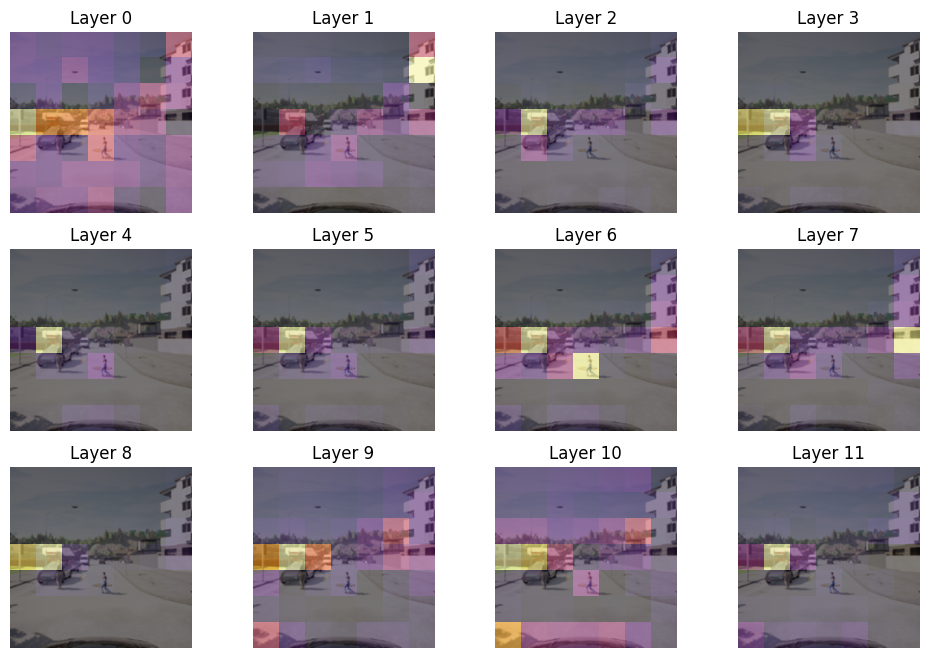

In [54]:
plot_attention_maps(source_img, model, att_map_dict)

### Attention Rollout

To compute the attention rollout from layer $l_i$ to layer $l_j$, we recursively multiply the attention weight matrices

$$
\tilde{A}(l_i) = 
\begin{cases}
A(l_i)*\tilde{A}(l_{i-1})  & i>j\\
A(l_i) & i=j
\end{cases}
$$

where $\tilde{A}$ is the attention rollout, $A$ is the raw attention, and $*$ denotes the matrix multiplication. Note that we must take into account the residual connections in the network, which are implemented by adding the input to the output of the layer. Therefore, we must also add the identity matrix to the attention weight matrix at each layer.

In [93]:
def attention_rollout(attention_dict: Dict[int, torch.Tensor]) -> torch.Tensor:
    """
    Attention rollout with the attention maps from each layer
        https://arxiv.org/abs/2005.00928
    """
    att_map = torch.stack([attention_dict[i] for i in range(len(attention_dict))], dim=0)  # L H S S or L 1 S S
    att_map = torch.mean(att_map, dim=1)  # L S S
    
    residual_att = torch.eye(att_map.size(1), device=att_map.device)  # S S
    aug_att_map = att_map + residual_att  # L S S
    aug_att_map = aug_att_map / aug_att_map.sum(dim=-1).unsqueeze(-1)  # L S S

    joint_attentions = torch.zeros(aug_att_map.size(), device=aug_att_map.device)  # L S S
    joint_attentions[0] = aug_att_map[0]  # S S

    for i in range(1, aug_att_map.size(0)):
        joint_attentions[i] = torch.matmul(aug_att_map[i], joint_attentions[i - 1])  # S S

    return joint_attentions # L S S


In [102]:
def plot_attention_rollout(att_dict: Dict[int, torch.Tensor], 
                           source_img: torch.Tensor,  # [batch_size, channels, height, width]
                           figsize: tuple = (12, 8)) -> None:
    """ 
    Plot the attention rollout for each layer in att_dict
        att_dict: a dictionary of attention maps for each layer
    """
    nr = int(np.rint(np.sqrt(len(att_map_dict))))
    nc = int(np.ceil(len(att_map_dict) / nr))

    att_rollout = attention_rollout(att_dict)  # L S S
    
    plt.figure(figsize=figsize)
    for layer, att_map in enumerate(att_rollout):
        plt.subplot(nr, nc, layer + 1)
        plt.imshow(source_img[0].permute(1, 2, 0).cpu().detach().numpy())

        z = cv2.resize(att_map[0, 1:].view(n_h, n_w).cpu().detach().numpy(), (h, w), interpolation=cv2.INTER_AREA)
        plt.imshow(z, alpha=0.5, cmap='inferno', interpolation='none')
        plt.axis('off')
        plt.title(f'Att. Rollout - Layer {layer}')
    plt.show()

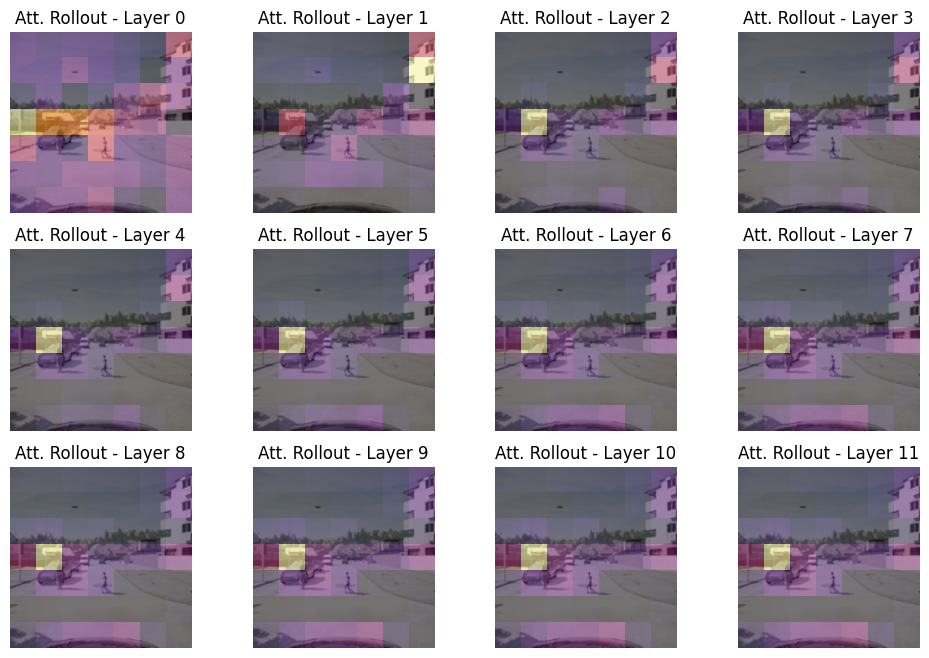

In [103]:
source_img = load_image('test_images/rgb_central002282.png')

plot_attention_rollout(att_map_dict, source_img)

In [55]:
def load_image(image_path: str, image_size: int = 224)-> torch.Tensor:
    img = Image.open(image_path).convert('RGB')
    img = img.resize((image_size, image_size))
    img = torchvision.transforms.ToTensor()(img).unsqueeze(0)  # [1, 3, 224, 224]

    return img

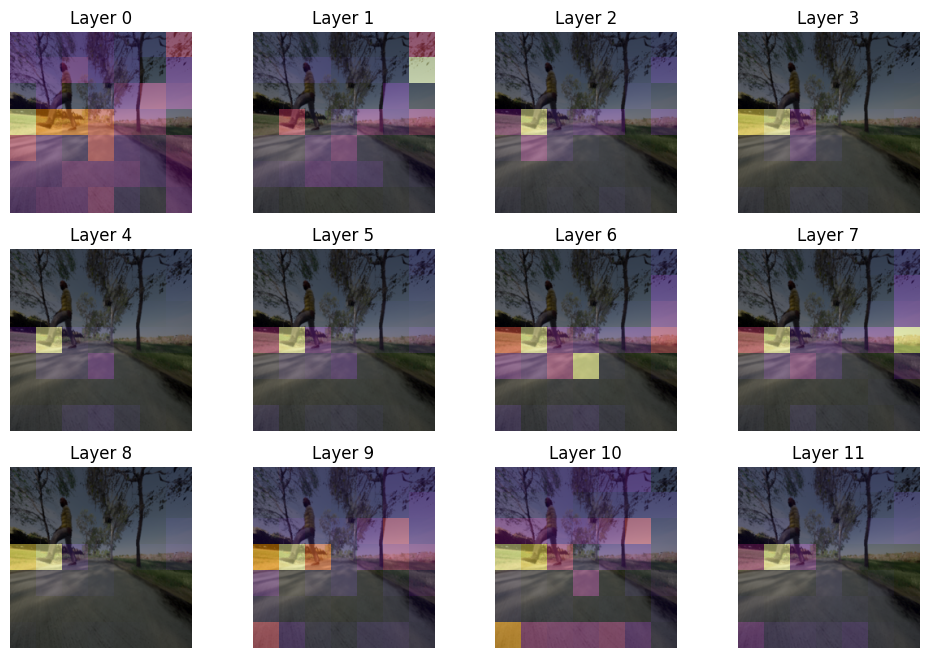

In [104]:
src_img = load_image('test_images/audirc_rgb_central003595.png')

x = preprocess_input_image(source_img, model)

att_map_dict2 = {}

for i in range(len(model.encoder_embedding_perception.encoder.layers)):

    x, a = get_attention_weights(model, i, x, average_attn_weights=True)
    att_map_dict2[i] = a

plot_attention_maps(src_img, model, att_map_dict2)

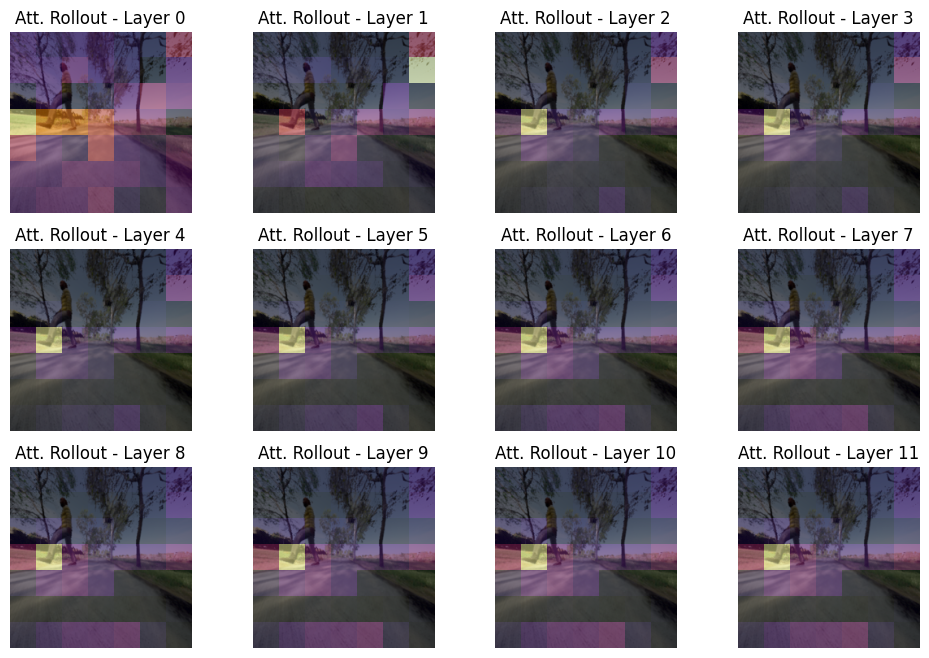

In [105]:
plot_attention_rollout(att_map_dict2, src_img)

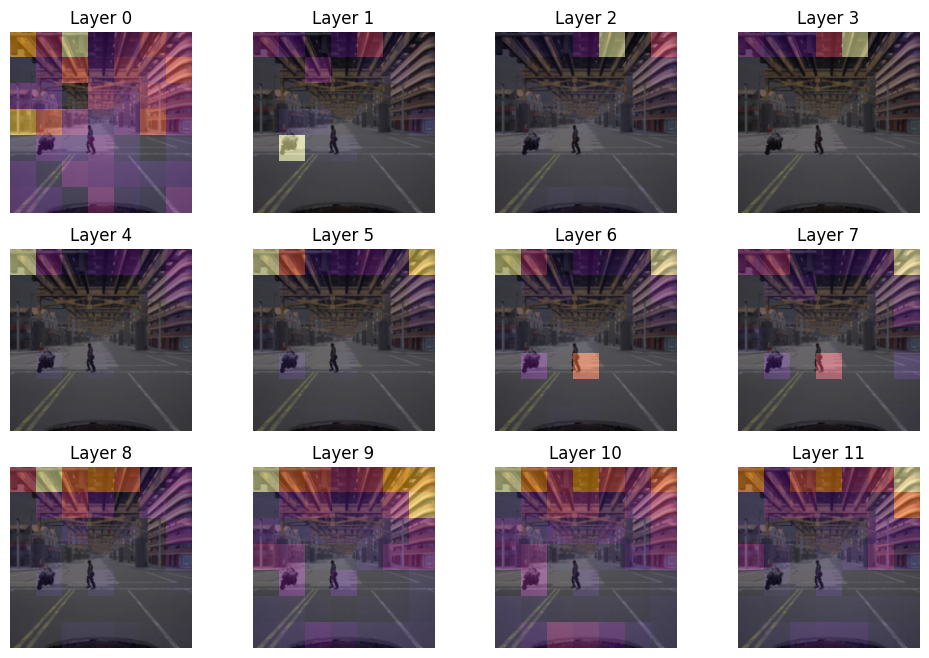

In [106]:
src_img = load_image('test_images/t03_rs01_rgb_central000174.png')

x = preprocess_input_image(source_img, model)

att_map_dict3 = {}

for i in range(len(model.encoder_embedding_perception.encoder.layers)):

    x, a = get_attention_weights(model, i, x, average_attn_weights=True)
    att_map_dict3[i] = a

plot_attention_maps(src_img, model)

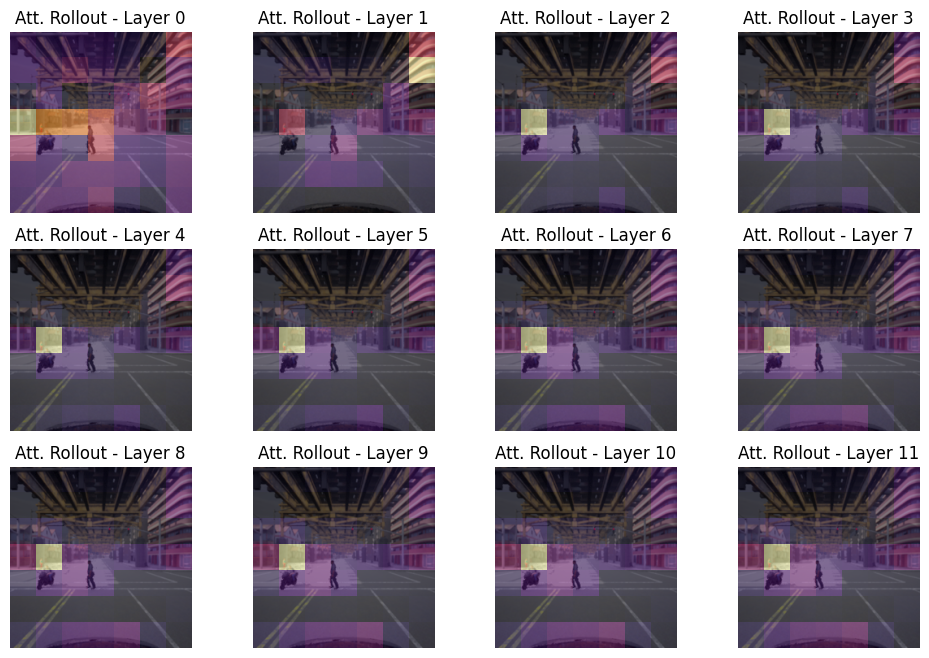

In [107]:
plot_attention_rollout(att_map_dict3, src_img)

I belive this shows that there is a bit of misalignment between which token is currently being used to predict the action and which token(s) is/are actually needed for this task. Indeed, the network is able to manage somewaht and make some correlation, but the tokens should be used in a smarter way, e.g.:

* Add a `[CMD]` token to the input sequence and its output will be used to predict the action
* Add a `[SPD]` token to the sequence, so that the Encoder may better correlate the current speed of the vehicle w.r.t. the current image
* Alternatively, we can use the `[CLS]` token representation at every layer to predict the action and not just at the final layer
* Add a `[CAM]` token to the sequence with the camera/view information (e.g. the camera number) and use it to predict the action
  * This will let the model also know which view is curently most important, improving interpretability
  * Related, if we mix the views on our current model, it won't really know how to act, so we need to give it a higher-level 'positional embedding'